# OCR Project 2: Scanner + OCR

# Importing the libraries

In [4]:
import numpy as np
import cv2
import imutils
from matplotlib import pyplot as plt

In [5]:
def show_img(img):
  fig = plt.gcf()
  fig.set_size_inches(20, 10)
  plt.axis("off")
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.show()

# Pre-processing the image

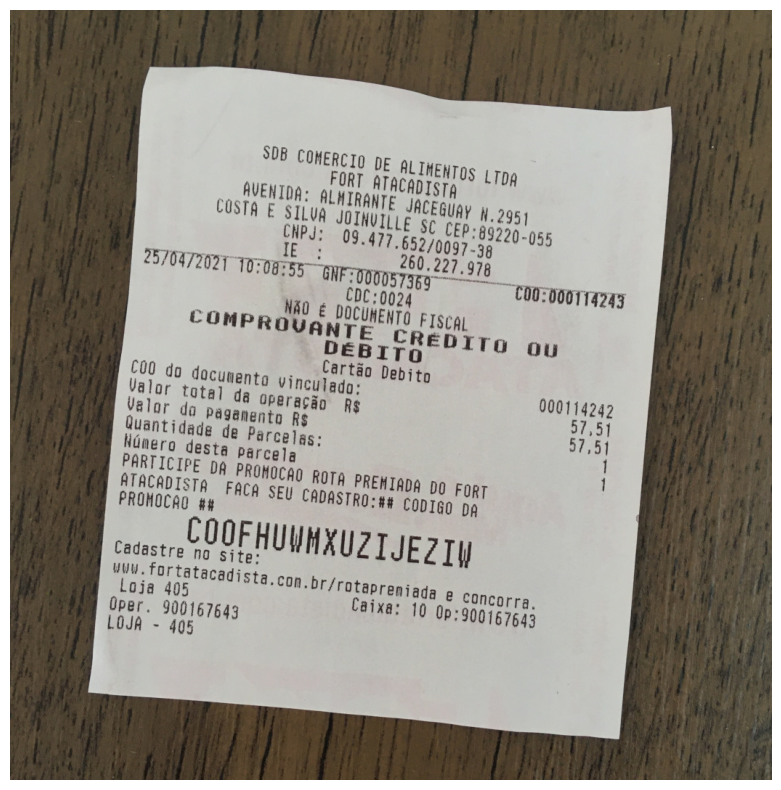

1061 1049


In [7]:
img = cv2.imread('Images/Images Project 2/doc_rotated01.jpg')
original = img.copy()
show_img(img)
(H, W) = img.shape[:2]
print(H, W)

## Grayscale

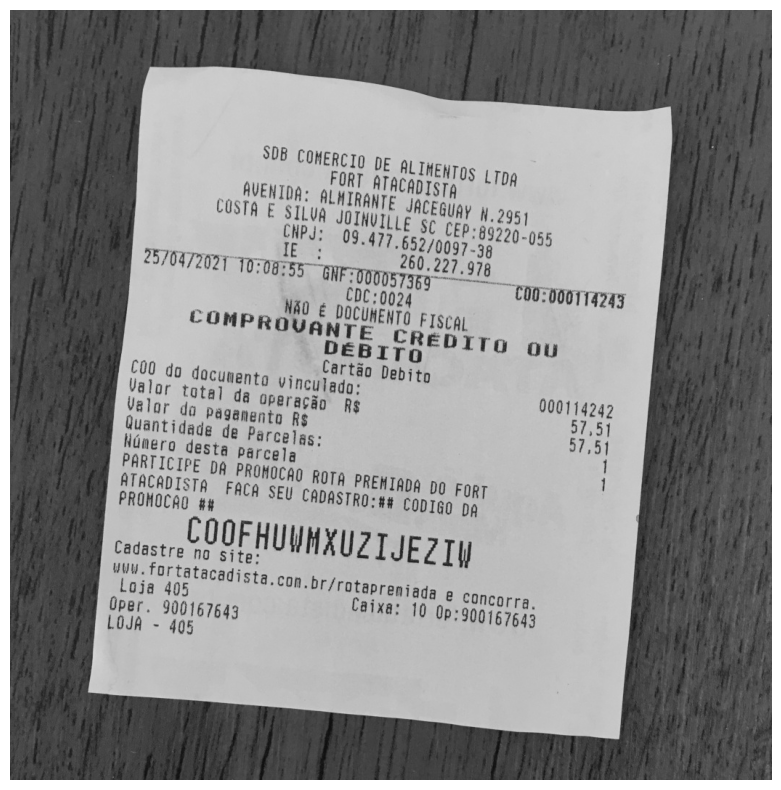

In [8]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
show_img(gray)

## Gaussian Blur

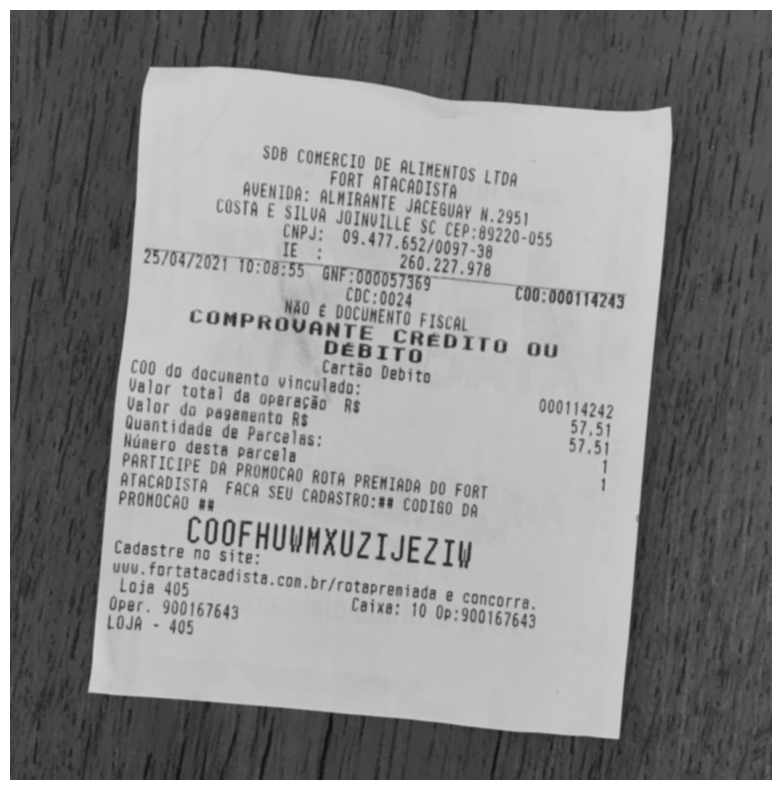

In [9]:
blur = cv2.GaussianBlur(gray, (5, 5), 0)
show_img(blur)

## Border detection (*Canny Edge*)

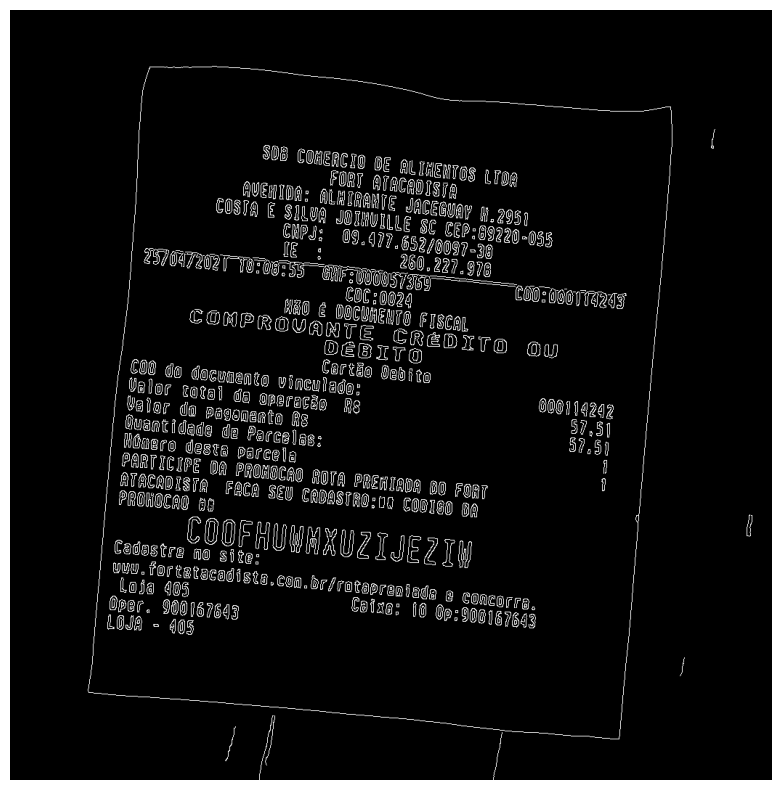

In [10]:
edged = cv2.Canny(blur, 60, 160)
show_img(edged)

# Contours detection

In [11]:
def find_contours(img): # EXTERNAL
  conts = cv2.findContours(img, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
  conts = imutils.grab_contours(conts)
  conts = sorted(conts, key = cv2.contourArea, reverse = True)[:6]
  return conts

In [12]:
conts = find_contours(edged.copy())

In [13]:
conts

[array([[[278,  77]],
 
        [[277,  78]],
 
        [[250,  78]],
 
        ...,
 
        [[300,  78]],
 
        [[285,  78]],
 
        [[284,  77]]], dtype=int32),
 array([[[277,  78]],
 
        [[278,  77]],
 
        [[284,  77]],
 
        ...,
 
        [[246,  79]],
 
        [[249,  79]],
 
        [[250,  78]]], dtype=int32),
 array([[[298, 702]],
 
        [[296, 704]],
 
        [[295, 704]],
 
        [[294, 705]],
 
        [[294, 707]],
 
        [[293, 708]],
 
        [[293, 719]],
 
        [[292, 720]],
 
        [[292, 729]],
 
        [[291, 730]],
 
        [[291, 731]],
 
        [[292, 732]],
 
        [[292, 734]],
 
        [[295, 737]],
 
        [[296, 737]],
 
        [[297, 738]],
 
        [[301, 738]],
 
        [[302, 737]],
 
        [[304, 737]],
 
        [[307, 734]],
 
        [[307, 731]],
 
        [[308, 730]],
 
        [[308, 722]],
 
        [[309, 721]],
 
        [[309, 710]],
 
        [[310, 709]],
 
        [[309, 708]],
 
        

## Locatting the biggest contour

- Douglas-Peucker: http://en.wikipedia.org/wiki/Ramer-Douglas-Peucker_algorithm

In [14]:
from re import A
for c in conts:
  perimeter = cv2.arcLength(c, True)
  approximation = cv2.approxPolyDP(c, 0.02 * perimeter, True)
  if len(approximation) == 4:
    larger = approximation
    break

In [15]:
larger

array([[[ 192,   78]],

       [[ 108,  940]],

       [[ 838, 1004]],

       [[ 909,  133]]], dtype=int32)

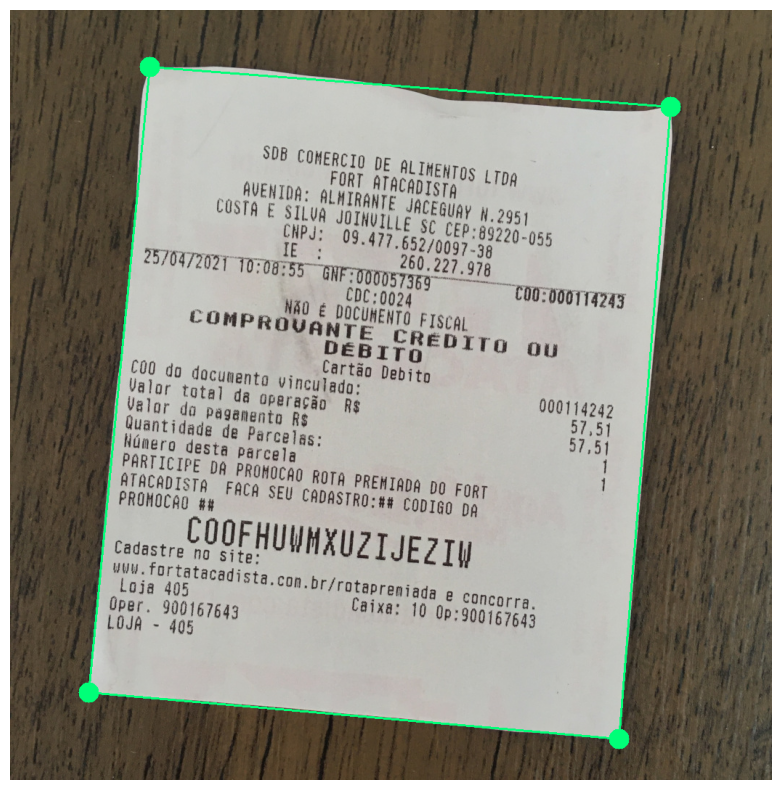

In [16]:
cv2.drawContours(img, larger, -1, (120,255,0), 28)
cv2.drawContours(img, [larger], -1, (120,255,0), 2)
show_img(img)

## Sorting the points

- top left
- top right
- bottom right
- bottom left

In [17]:
def sort_points(points):
  points = points.reshape((4,2))
  #print(points.shape)
  new_points = np.zeros((4, 1, 2), dtype=np.int32)
  #print(new_points.shape)
  #print(new_points)
  add = points.sum(1)
  #print(add)

  new_points[0] = points[np.argmin(add)]
  new_points[2] = points[np.argmax(add)]
  dif = np.diff(points, axis = 1)
  new_points[1] = points[np.argmin(dif)]
  new_points[3] = points[np.argmax(dif)]
  #print(new_points)

  return new_points

In [18]:
larger

array([[[ 192,   78]],

       [[ 108,  940]],

       [[ 838, 1004]],

       [[ 909,  133]]], dtype=int32)

In [19]:
192 + 78, 108 + 940

(270, 1048)

In [20]:
points_larger = sort_points(larger)
print(points_larger)

[[[ 192   78]]

 [[ 909  133]]

 [[ 838 1004]]

 [[ 108  940]]]


## Transformation matrix

In [21]:
pts1 = np.float32(points_larger)
pts1

array([[[ 192.,   78.]],

       [[ 909.,  133.]],

       [[ 838., 1004.]],

       [[ 108.,  940.]]], dtype=float32)

In [22]:
print(W, H)

1049 1061


In [23]:
pts2 = np.float32([[0,0], [W, 0], [W, H], [0, H]])
pts2

array([[   0.,    0.],
       [1049.,    0.],
       [1049., 1061.],
       [   0., 1061.]], dtype=float32)

In [24]:
matrix = cv2.getPerspectiveTransform(pts1, pts2)
matrix

array([[ 1.47103022e+00,  1.43348652e-01, -2.93618997e+02],
       [-9.58731834e-02,  1.24983768e+00, -7.90796880e+01],
       [ 1.08773828e-05,  2.32288006e-05,  1.00000000e+00]])

## Perspective transformation

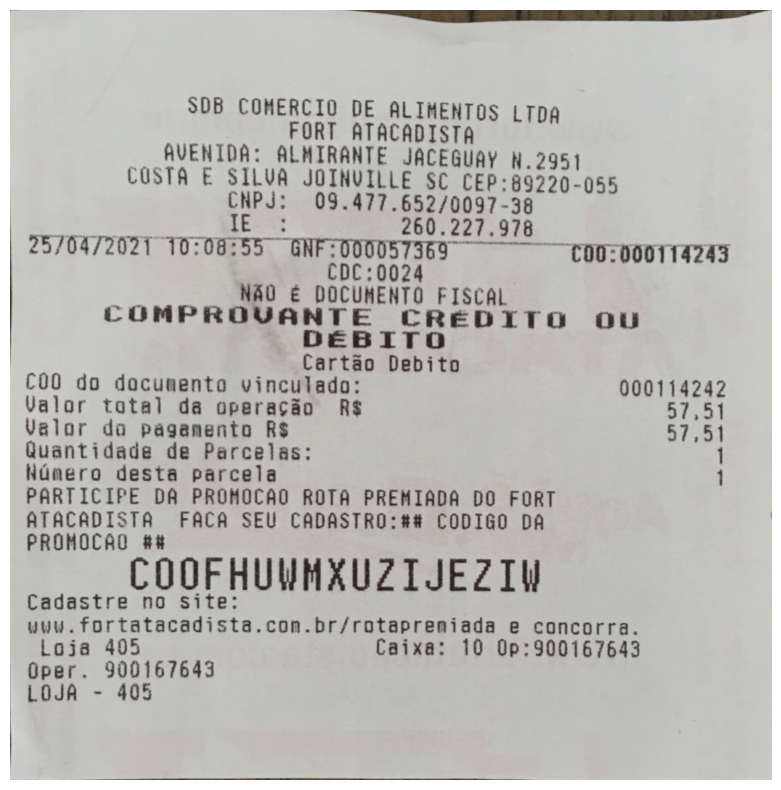

In [25]:
transform = cv2.warpPerspective(original, matrix, (W, H))
show_img(transform)

# OCR with Tesseract

In [26]:
# !sudo apt install tesseract-ocr
# !pip install pytesseract

In [29]:
import pytesseract

In [30]:
# !mkdir tessdata
# !wget -O ./tessdata/por.traineddata https://github.com/tesseract-ocr/tessdata/blob/main/por.traineddata?raw=true

In [31]:
config_tesseract = "--tessdata-dir tessdata"

In [32]:
text = pytesseract.image_to_string(transform, lang='por', config=config_tesseract)
print(text)

SDB COMERCIO DE ALIMENTOS LTDA
FORT ATACADISTA
AVENIDA: ALMIRANTE JACEGUAY N.2951
COSTA E SILVA JOINUILLE SC CEP:89220-055
CNPJ: 09.477.652/0097-38
7 SRAm 260.227.978

2570972027 T0:08:55" Gnrzggvgãzgsà““““'** ***** COOT0001142A3

NÃO É DOCUMENTO FISCAL
COMPROUVUANTE CREDITO OU

DÉBIT

Cartão Debito
C0OO do documento vinculado: 000114242
Valor total da operação R$ RAA
Valor do pagamento R$ TAA
Quantidade de Parcelas:
Número desta parcela 1

PARTICIPE DA PROMOCAO ROTA PREMIADA DO FORT
ATACADISTA FACA SEU CADASTRO:%% CODIGO DA
PROMOCAO &%

COOFHUWMXUZIJEZIV

Cadastre no site:
uuu.fortatacadista.con.br/rotapreniada e concorra.
Loja 405 Caixa: 10 0p:900167643
Oper. 900167643
LOJA - 405




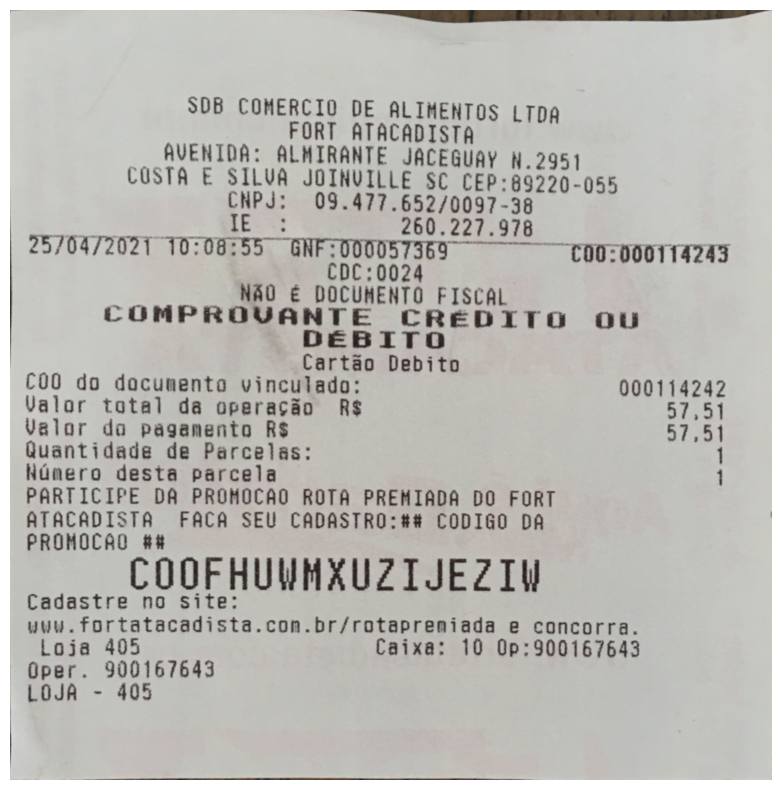

In [33]:
increase = cv2.resize(transform, None, fx=1.5, fy = 1.5, interpolation=cv2.INTER_CUBIC)
show_img(increase)

In [34]:
text = pytesseract.image_to_string(increase, lang='por', config=config_tesseract)
print(text)

SDB COMERCIO DE ALIMENTOS LTDA
FORT ATACADISTA
AVENIDA: ALMIRANTE JACEGUAY N.2951

COSTA E SILVA JOINVILLE SC CEP:89220-055

CNPJ: 09.477.652/0097-38
RNA A cA u

zmmnw1mm&s*wqªªg?r“ TU0 000114283
NÃO é DOCUMENTO FISCAL

COMPROVANTE CRÉDITO OU

DÉEÉBITO

Cartão Debito
C0OO0O do documento vincutado: 000114242
Valor total da operação R$ LW A Ne R
Valor do paganmento R$ R o |
Quantidade de Parcelas: 1
Número desta parcela 1

PARTICIPE DA PROMOCAO ROTA PREMIADA DO FORT
ATACADISTA FACA SEU CADASTRO:&%&% CODIGO DA
PROMOCÃAO k%

COOFHUWMXUZIJEZIMV

Cadastre no site:
uuuw.fortatacadista.con.br/rotaprenmniada e concorra.
Loja 405 Caixa: 10 0p:900167643
Oper. 900167643
LOJA - 405



# Improving image quality

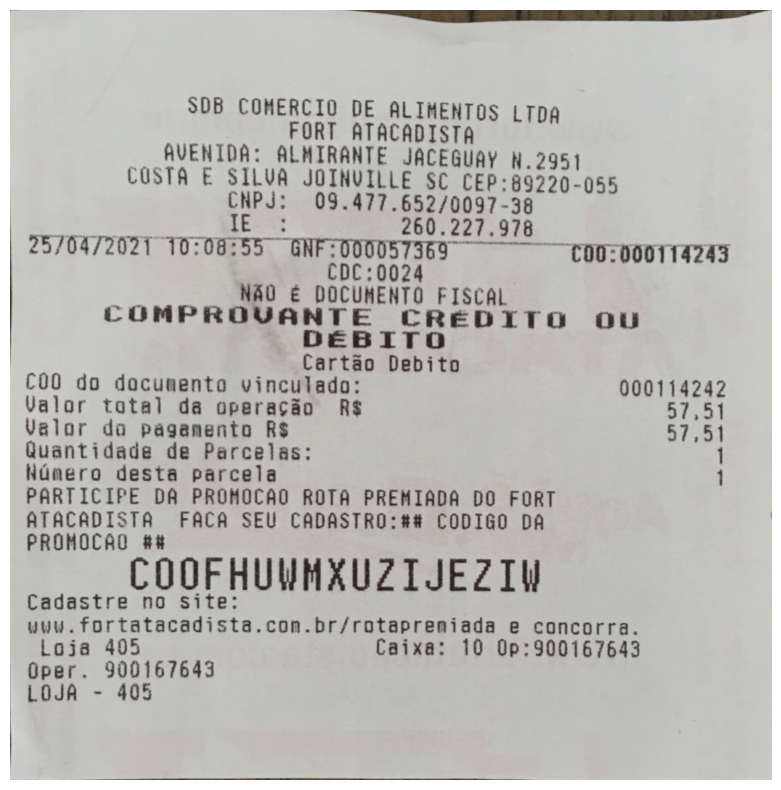

In [35]:
show_img(transform)

## Increasing brightness and contrast

In [36]:
transform.shape

(1061, 1049, 3)

In [37]:
brightness = 50
contrast = 80
adjust = np.int16(transform)
adjust.shape

(1061, 1049, 3)

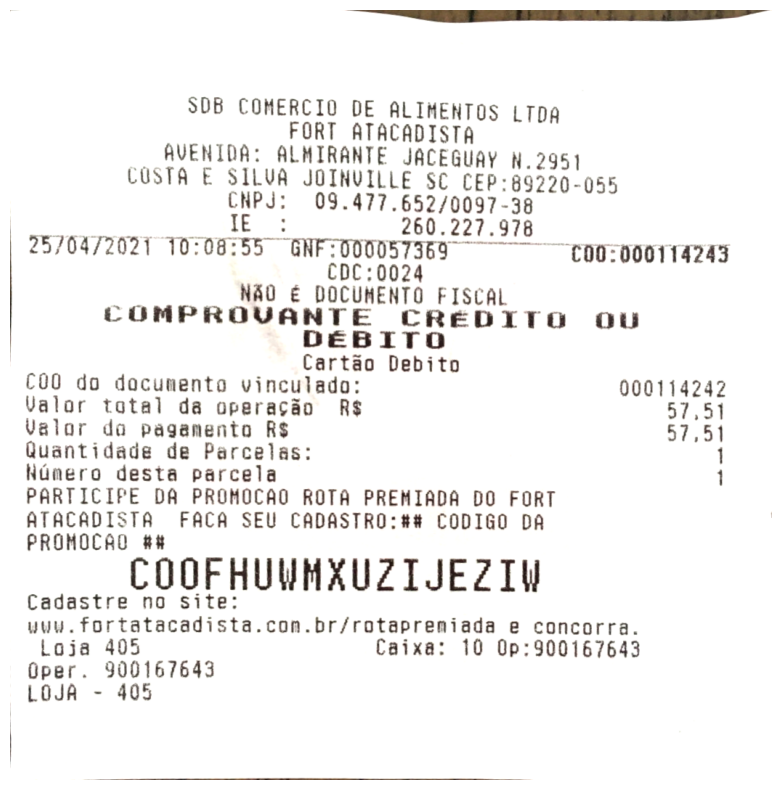

In [38]:
adjust = adjust * (contrast / 127 + 1) - contrast + brightness
adjust = np.clip(adjust, 0, 255)
adjust = np.uint8(adjust)
show_img(adjust)

## Adaptive thresholding

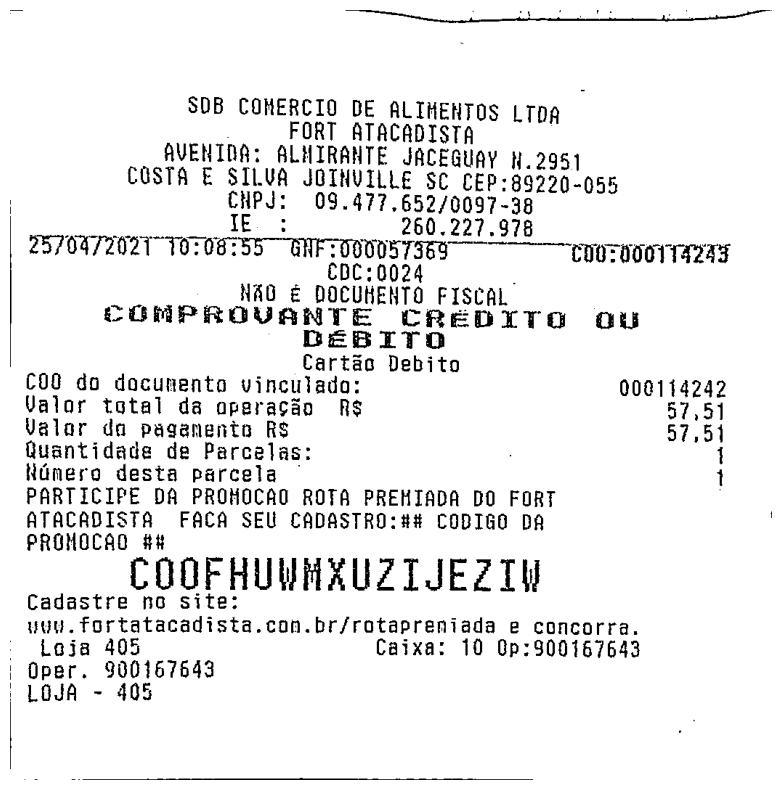

In [39]:
processed_img = cv2.cvtColor(transform, cv2.COLOR_BGR2GRAY)
processed_img = cv2.adaptiveThreshold(processed_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 9)
show_img(processed_img)

## Removing edges

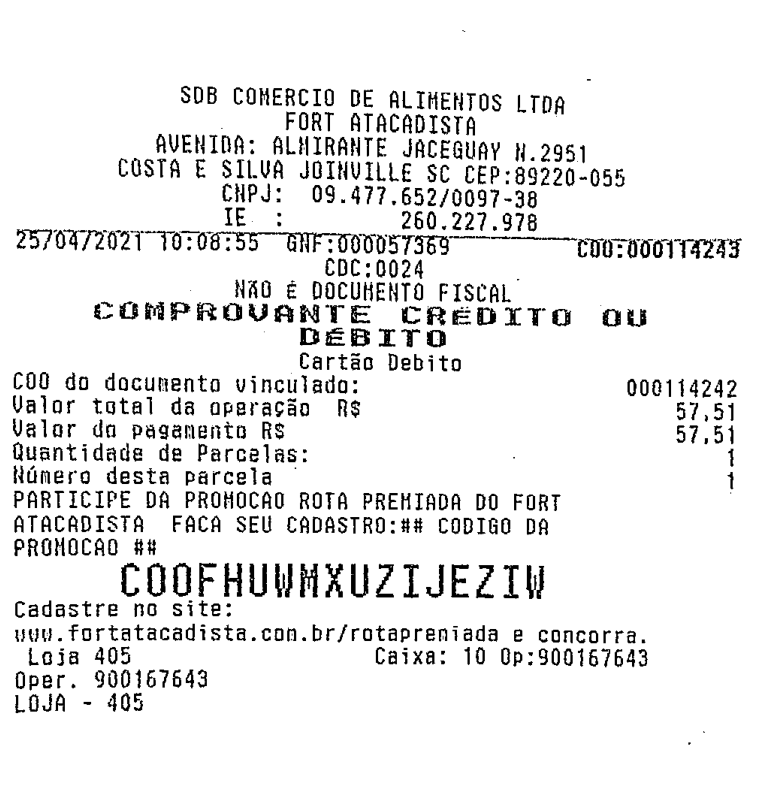

In [40]:
margin = 18
img_edges = processed_img[margin:H - margin, margin:W - margin]
show_img(img_edges)

## Comparison

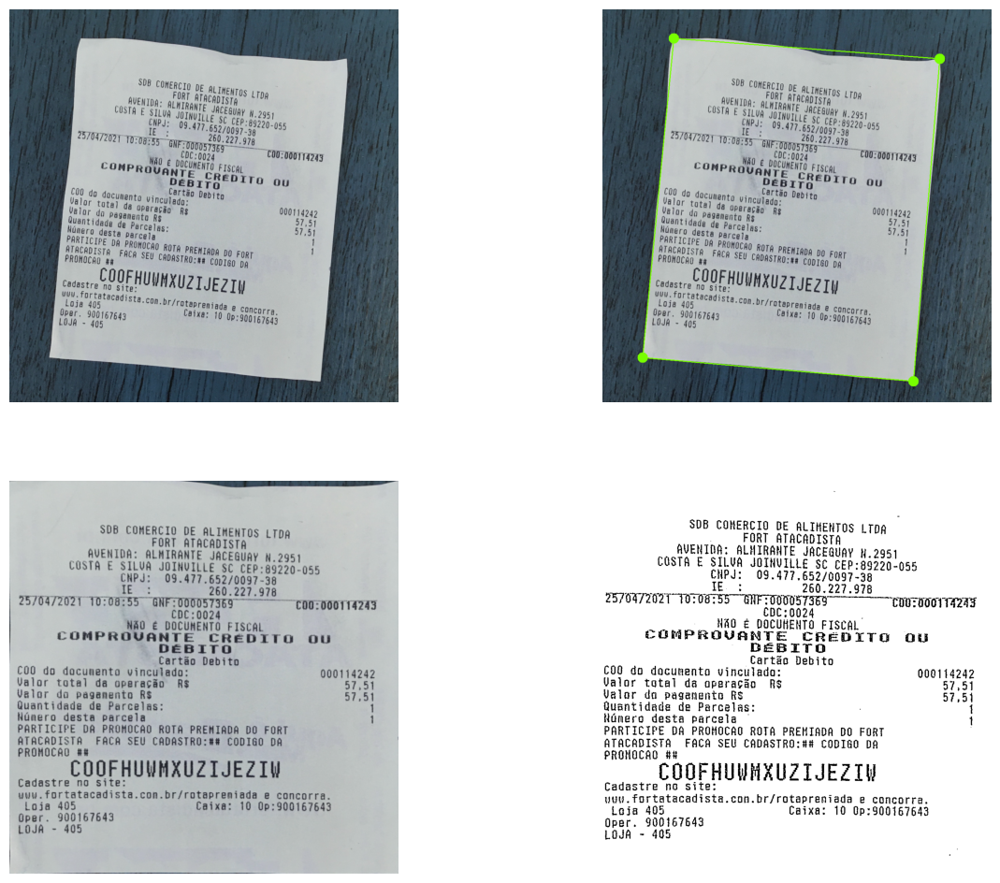

In [41]:
fig, im = plt.subplots(2, 2, figsize=(15,12))
for x in range(2):
  for y in range(2):
    im[x][y].axis('off')
im[0][0].imshow(original)
im[0][1].imshow(img)
im[1][0].imshow(transform, cmap='gray')
im[1][1].imshow(img_edges, cmap='gray')
plt.show();

# Putting all together

In [42]:
def transform_image(image_file):
  img = cv2.imread(image_file)
  original = img.copy()
  show_img(img)
  (H, W) = img.shape[:2]

  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  blur = cv2.GaussianBlur(gray, (7, 7), 0)
  edged = cv2.Canny(blur, 60, 160)
  show_img(edged)
  conts = find_contours(edged.copy())
  for c in conts:
    peri = cv2.arcLength(c, True)
    aprox = cv2.approxPolyDP(c, 0.02 * peri, True)

    if len(aprox) == 4:
      larger = aprox
      break

  cv2.drawContours(img, larger, -1, (120, 255, 0), 28)
  cv2.drawContours(img, [larger], -1, (120, 255, 0), 2)
  show_img(img)

  points_larger = sort_points(larger)
  pts1 = np.float32(points_larger)
  pts2 = np.float32([[0, 0], [W, 0], [W, H], [0, H]])

  matrix = cv2.getPerspectiveTransform(pts1, pts2)
  transform = cv2.warpPerspective(original, matrix, (W, H))

  show_img(transform)
  return transform

In [43]:
def process_img(img):
  processed_img = cv2.resize(img, None, fx=1.6, fy=1.6, interpolation=cv2.INTER_CUBIC)
  processed_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  processed_img = cv2.adaptiveThreshold(processed_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 9)
  return processed_img

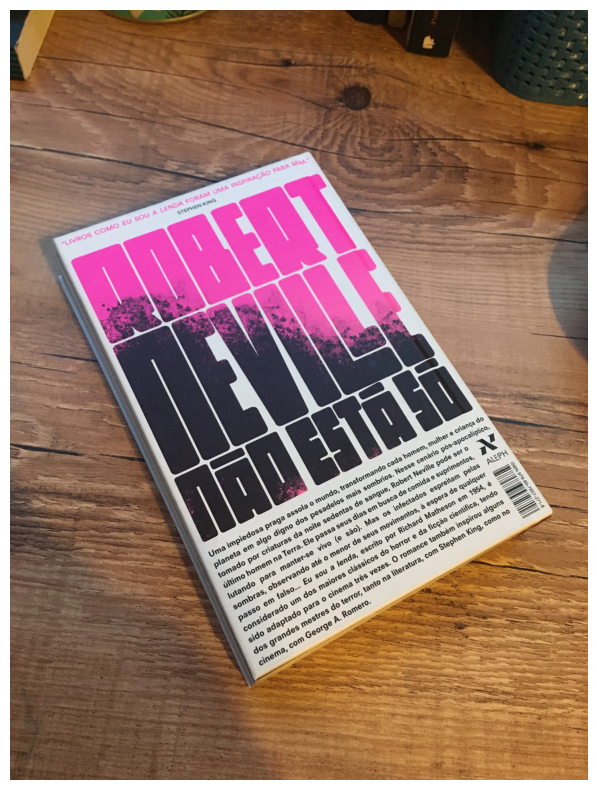

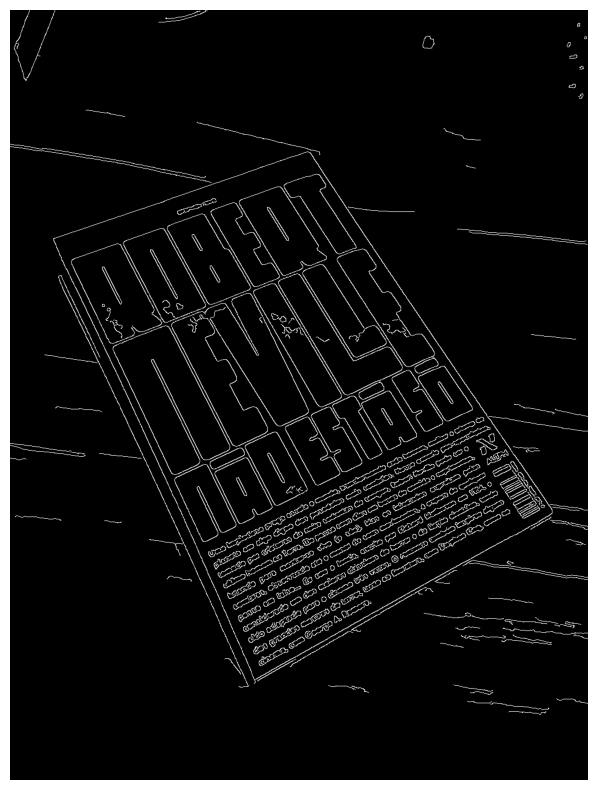

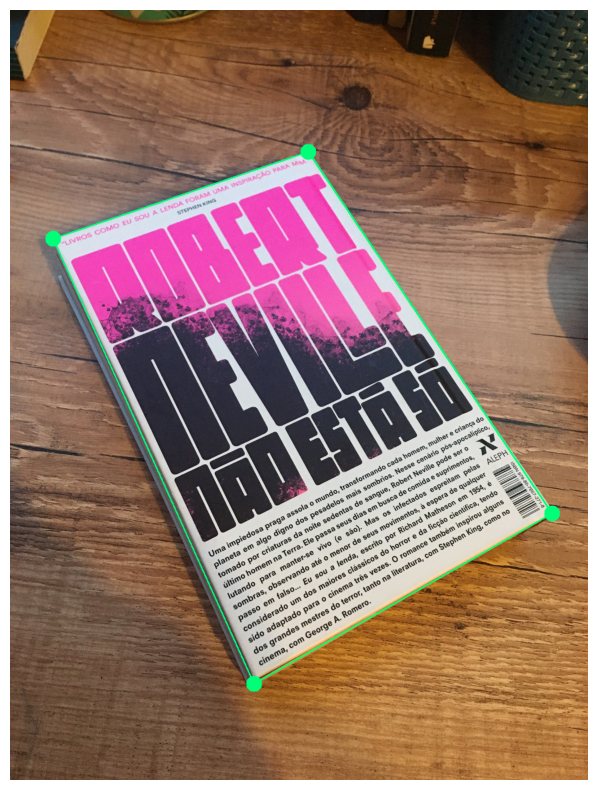

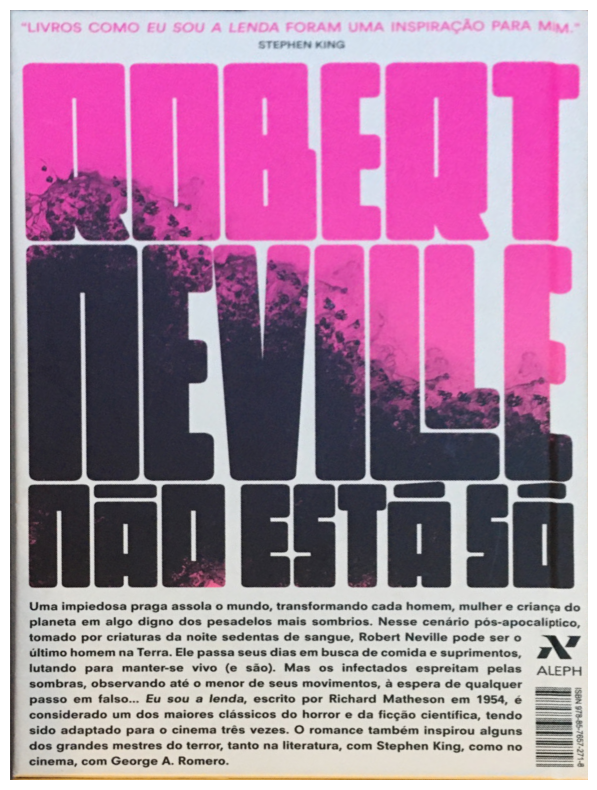

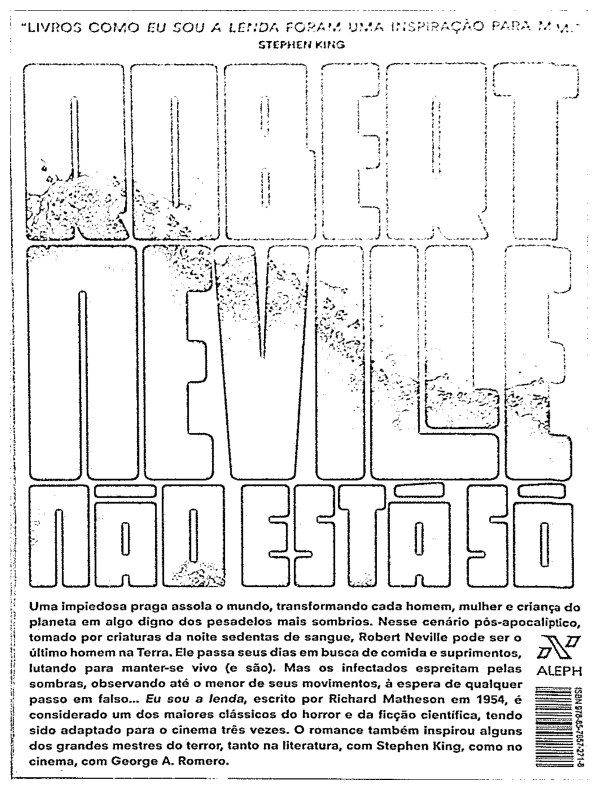

In [45]:
img = transform_image('Images/Images Project 2/book1.jpg')
img = process_img(img)
show_img(img)